# Лабораторна робота 4: Advanced Nets

## 3. Перенесення стилю зображення

Вкрадемо приклад https://keras.io/examples/generative/neural_style_transfer із алгоритмом перенесення стилю одного зображення на інше, який був на лекції

In [1]:
import os

os.environ["KERAS_BACKEND"] = "tensorflow"

import keras
import numpy as np
import tensorflow as tf
from keras.applications import vgg19

# Читаємо локальні файли

base_image = keras.utils.load_img("dog.jpg")
style_reference_image = keras.utils.load_img("cubism_style.jpg")
result_prefix = "dogg2"

# Weights of the different loss components
total_variation_weight = 1e-6
style_weight = 1e-6
content_weight = 2.5e-8

# Dimensions of the generated picture.
width, height = base_image.size
img_nrows = 400
img_ncols = int(width * img_nrows / height)

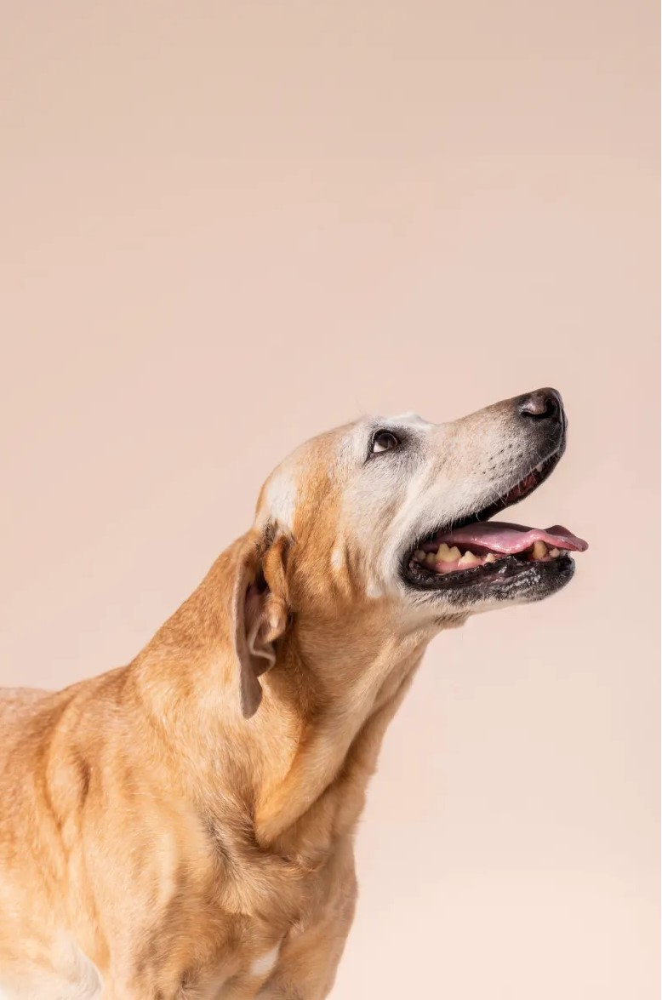

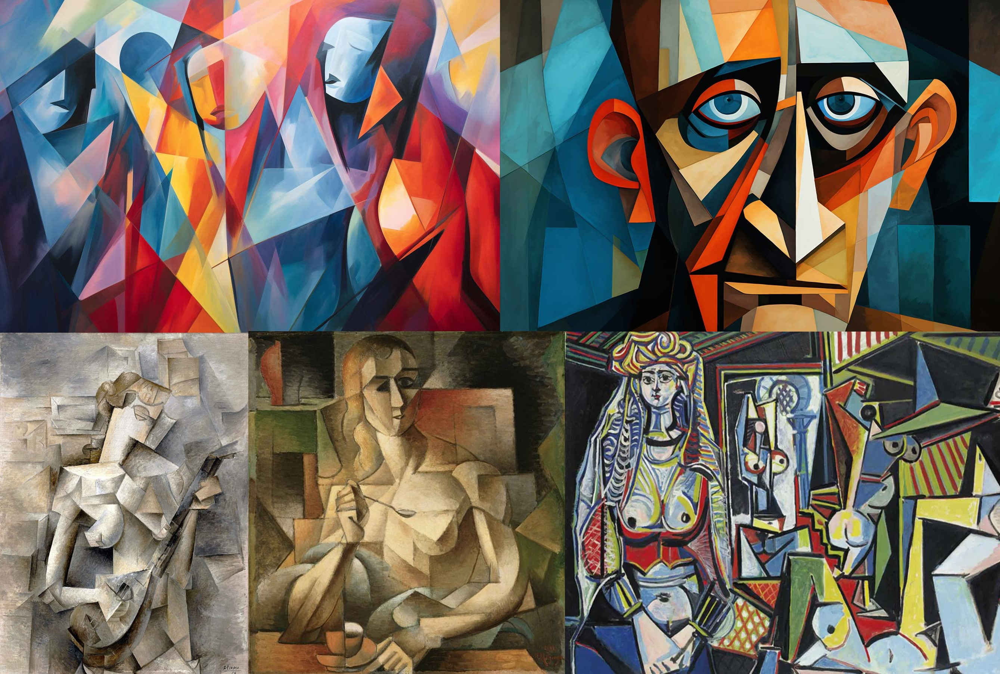

In [2]:
from IPython.display import display

display(base_image)
display(style_reference_image)

Було створено колаж із декількох картин в стилі кубізму, щоб загальніше "описати стиль" в одному зображені.

Переносити будемо на картинку песа.

In [3]:
# Функції обробки зображень (не чіпаємо)

def preprocess_image(image_path):
    # Util function to open, resize and format pictures into appropriate tensors
    img = keras.utils.load_img(image_path, target_size=(img_nrows, img_ncols))
    img = keras.utils.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = vgg19.preprocess_input(img)
    return tf.convert_to_tensor(img)


def deprocess_image(x):
    # Util function to convert a tensor into a valid image
    x = x.reshape((img_nrows, img_ncols, 3))
    # Remove zero-center by mean pixel
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    # 'BGR'->'RGB'
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype("uint8")
    return x

In [4]:
def gram_matrix(x):
    x = tf.transpose(x, (2, 0, 1))
    features = tf.reshape(x, (tf.shape(x)[0], -1))
    gram = tf.matmul(features, tf.transpose(features))
    return gram

# лосс функція по стилю
def style_loss(style, combination):
    S = gram_matrix(style)
    C = gram_matrix(combination)
    channels = 3
    size = img_nrows * img_ncols
    return tf.reduce_sum(tf.square(S - C)) / (4.0 * (channels**2) * (size**2))

# лосс функція по змісту
def content_loss(base, combination):
    return tf.reduce_sum(tf.square(combination - base))


Алгоритм будується на основі вже натренованої VGG19

In [5]:
# Build a VGG19 model loaded with pre-trained ImageNet weights
model = vgg19.VGG19(weights="imagenet", include_top=False)

# Get the symbolic outputs of each "key" layer (we gave them unique names).
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])

# Set up a model that returns the activation values for every layer in
# VGG19 (as a dict).
feature_extractor = keras.Model(inputs=model.inputs, outputs=outputs_dict)


In [6]:
# Як ознаки стилю беремо виходи на одному шарі в кожному блоці мережі
style_layer_names = [
    "block1_conv2",
    "block2_conv1",
    "block3_conv3",
    "block4_conv3"
]

# Шар, який визначає "зміст" зображення
content_layer_name = "block5_conv2"


def compute_loss(combination_image, base_image, style_reference_image):
    input_tensor = tf.concat(
        [base_image, style_reference_image, combination_image], axis=0
    )
    features = feature_extractor(input_tensor)

    # Initialize the loss
    loss = tf.zeros(shape=())

    # Add content loss
    layer_features = features[content_layer_name]
    base_image_features = layer_features[0, :, :, :]
    combination_features = layer_features[2, :, :, :]
    loss = loss + content_weight * content_loss(
        base_image_features, combination_features
    )
    # Add style loss
    for layer_name in style_layer_names:
        layer_features = features[layer_name]
        style_reference_features = layer_features[1, :, :, :]
        combination_features = layer_features[2, :, :, :]
        sl = style_loss(style_reference_features, combination_features)
        loss += (style_weight / len(style_layer_names)) * sl

    # Add total variation loss
    # loss += total_variation_weight * total_variation_loss(combination_image)
    return loss


Функція оптимізації (стохастичний градієнтний спуск):

In [7]:
@tf.function
def compute_loss_and_grads(combination_image, base_image, style_reference_image):
    with tf.GradientTape() as tape:
        loss = compute_loss(combination_image, base_image, style_reference_image)
    grads = tape.gradient(loss, combination_image)
    return loss, grads


# Я ще додав момент Нестерова

optimizer = keras.optimizers.SGD(
    keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=100.0, decay_steps=100, decay_rate=0.96
    ),
    nesterov=True,
)

Оптимізація:

In [8]:
base_image = preprocess_image("dog.jpg")
style_reference_image = preprocess_image("cubism_style.jpg")
combination_image = tf.Variable(preprocess_image("dog.jpg"))

iterations = 200
for i in range(1, iterations + 1):
    loss, grads = compute_loss_and_grads(
        combination_image, base_image, style_reference_image
    )
    optimizer.apply_gradients([(grads, combination_image)])
    if i % 20 == 0:
        print("Iteration %d: loss=%.2f" % (i, loss))
        img = deprocess_image(combination_image.numpy())
        fname = result_prefix + "_at_iteration_%d.png" % i
        keras.utils.save_img(fname, img)


c:\Users\matki\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\models\functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(3, 400, 264, 3))
  warnings.warn(msg)


Iteration 20: loss=27740.91
Iteration 40: loss=18649.72
Iteration 60: loss=14269.60
Iteration 80: loss=11580.89
Iteration 100: loss=9747.74
Iteration 120: loss=8412.35
Iteration 140: loss=7394.97
Iteration 160: loss=6593.35
Iteration 180: loss=5944.69
Iteration 200: loss=5408.13


Я спробував обчислювати лосс по стилю на різних шарах мережі (файли dogg та dogg2). Перенесення стилю вийшло дещо різним, хоча глобально дуже схоже